In [1]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [2]:
%cd /content/drive/MyDrive/DL main project

/content/drive/.shortcut-targets-by-id/1Ay5xa3D4qN7NKvPeYnj0jSe8D-mlh7lg/DL main project


# **Import Lib**

In [4]:
import numpy as np
import pandas as pd
import os
import cv2
from tensorflow.image import ssim
from process_data import ProcessData, DataGenerator
from xray_abnormal_viewer import XABViewer
from dae_model import DAE_Model
from model_helper import Model_Args
from classifier_model import Classifier
from keras.models import  load_model
from abnormal_detector import AbnormalDetector, XRayObject, IType
from sklearn.model_selection import train_test_split

import matplotlib.pyplot as plt
from matplotlib.pyplot import Rectangle
from tqdm import tqdm

# **Load Data**

In [5]:
csv_path = './csv'
img_load_dir = './train/png'
npy_load_dir = './train/npy'
mask_load_dir = './train/mask'
lung_load_dir = './train/lung'
noise_load_dir = './train/noise'

#class_ids = ['{:02d}'.format(i) for i in range(15)]
# make process variable
pdata = ProcessData(seed=42)

In [6]:
def get_data_test_class_14():
  batch_14 = ['{:03d}'.format(i) for i in range(21)]
  # npy_dict = {}
  mask_dict = {}
  img_dict = {}
  lung_dict = {}
  noise_dict = {}
  for b in batch_14:
    batch_csv = os.path.join(csv_path,'14',b+'.csv')
    mask_load_path = os.path.join(mask_load_dir,'14',b)
    img_load_path = os.path.join(img_load_dir,'14',b)
    lung_load_path = os.path.join(lung_load_dir,'14',b)
    noise_load_path = os.path.join(noise_load_dir,'14',b)
    noise_dict[noise_load_path] = mask_dict[mask_load_path] = img_dict[img_load_path] = lung_dict[lung_load_path] = pdata.get_img_names(batch_csv)
  img_paths = pdata.get_paths(img_dict,'.png')
  mask_paths = pdata.get_paths(mask_dict,'.npy')
  lung_paths = pdata.get_paths(lung_dict,'.png')
  noise_paths = pdata.get_paths(noise_dict,'.png')
  _ , img_paths, _, mask_paths, _, lung_paths, _, noise_paths = train_test_split(img_paths, mask_paths, lung_paths, noise_paths,test_size=0.1,random_state=42)
  return img_paths, mask_paths, lung_paths, noise_paths

In [7]:
def get_data_class_abnormal(class_ids = ['12']):
  # npy_dict = {}
  mask_dict = {}
  img_dict = {}
  lung_dict = {}
  noise_dict = {}
  for cid in class_ids:
    batch_csv = os.path.join(csv_path,cid+'.csv')
    mask_load_path = os.path.join(mask_load_dir,cid)
    img_load_path = os.path.join(img_load_dir,cid)
    lung_load_path = os.path.join(lung_load_dir,cid)
    noise_load_path = os.path.join(noise_load_dir,cid)
    noise_dict[noise_load_path] = mask_dict[mask_load_path] = img_dict[img_load_path] = lung_dict[lung_load_path] = pdata.get_img_names(batch_csv)
  img_paths = pdata.get_paths(img_dict,'.png')
  mask_paths = pdata.get_paths(mask_dict,'.png')
  lung_paths = pdata.get_paths(lung_dict,'.png')
  noise_paths = pdata.get_paths(noise_dict,'.png')
  return img_paths, mask_paths, lung_paths, noise_paths

In [8]:
img_paths, mask_paths, lung_paths, noise_paths = get_data_class_abnormal()

# **Evaluate**

In [9]:
normals = get_data_test_class_14()[0]
normals = normals[:len(img_paths)]

In [10]:
test_paths = np.hstack([img_paths,normals])
test_paths.shape

(192,)

In [11]:
def get_round_truth(train,path,size):
  img_name = os.path.basename(path)
  img_name = os.path.splitext(img_name)[0]
  boxs = train[train['image_id']==img_name][['x_min','y_min','x_max','y_max']].values.astype(np.uint32)
  itruth = np.zeros(size,dtype=np.uint8)
  for box in boxs:
    x_min, y_min, x_max, y_max = box
    itruth[y_min:y_max,x_min:x_max] = 1  
  return boxs, itruth

def evaluate_data(ypred,ytruth):
  sp = np.count_nonzero(ypred)
  spt = np.count_nonzero(ypred*ytruth)
  spyt = np.count_nonzero(ytruth)
  if np.isclose(sp,0) and np.isclose(spyt,0):
    return 1
  elif np.isclose(sp,0):
    return 0
  return spt/sp

## Model autoencoder_c128x128x64x3_f32_64_64_ep200_relu_mxpl_deconv

In [12]:
# model 2
mask_recover_model_paths = ['./model/checkpoint/autoencoder_mask_c128x128x64x6_f32x64x2_ep150_sigmoid/autoencoder_mask_c128x128x64x6_f32x64x2_ep150_sigmoid-0033-0.0065.h5',
                            './model/checkpoint/autoencoder_mask_d512_f32x64x4_ep100_sigmoid_maxpl/autoencoder_mask_d512_f32x64x4_ep100_sigmoid_maxpl-0043-0.0144.h5']
lung_recover_model_path = './model/checkpoint/autoencoder_c128x128x64x3_f32_64_64_ep200_relu_mxpl_deconv/autoencoder_c128x128x64x3_f32_64_64_ep200_relu_mxpl_deconv-0060-13.5878.h5'
mask_model_path = "./model/best_model.h5"

In [13]:
def smooth(img):
  return cv2.GaussianBlur(img,(5,5),0)

In [14]:
abdetector = AbnormalDetector(mask_model_path,mask_recover_model_paths,lung_recover_model_path,test_paths[:10],5,smooth=smooth,run_in_smooth=True)


segment mask:
2/2 [==============================] - 46s 22s/step
recover mask:
2/2 [==============================] - 12s 6s/step
recover lung:
2/2 [==============================] - 22s 11s/step


In [15]:
index = 1
lung = abdetector.xrayobjects[index].lung
relung = abdetector.xrayobjects[index].relung

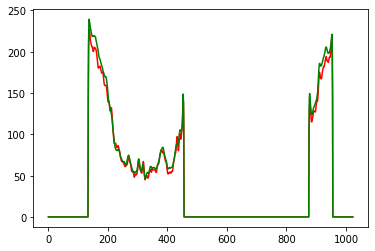

In [16]:
plt.plot(lung[600,:,0],color='r')
plt.plot(relung[600,:,0]*1.05,color='g')

In [17]:
abdetector.update_abnormals(4,ctype='+')

In [18]:
viewoxray = abdetector.xrayobjects[0]

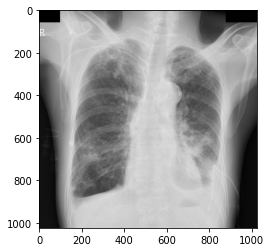

In [19]:
plt.imshow(viewoxray.img)

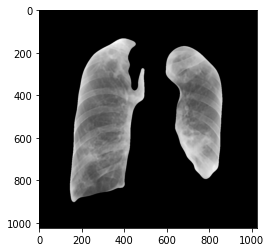

In [20]:
plt.imshow(viewoxray.relung[:,:,0],cmap='gray')

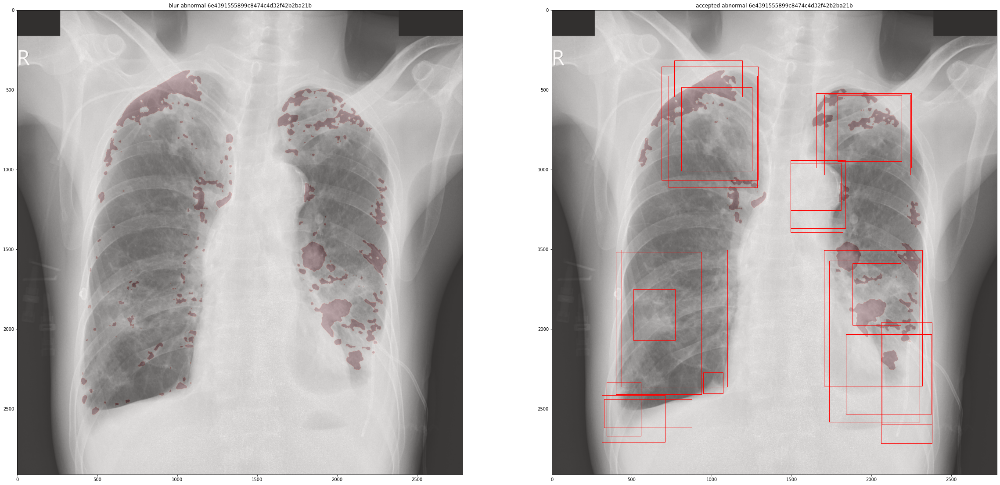

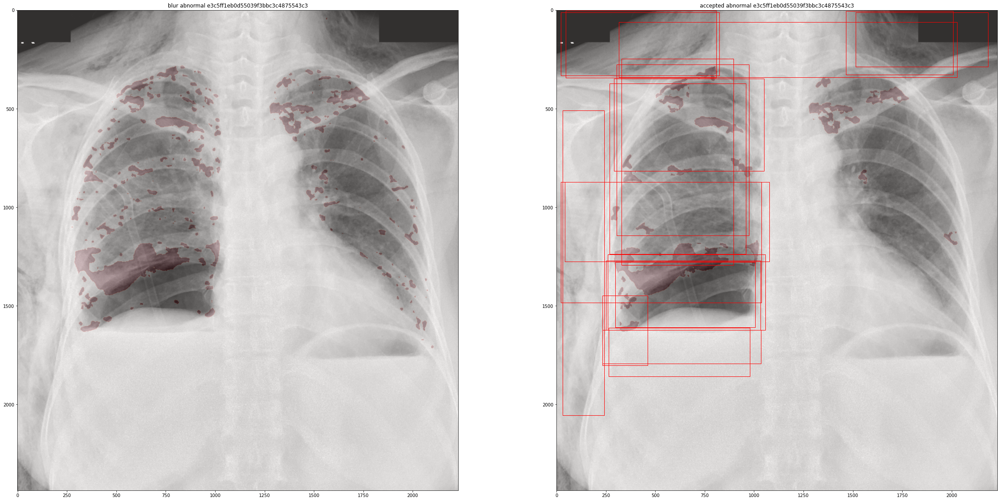

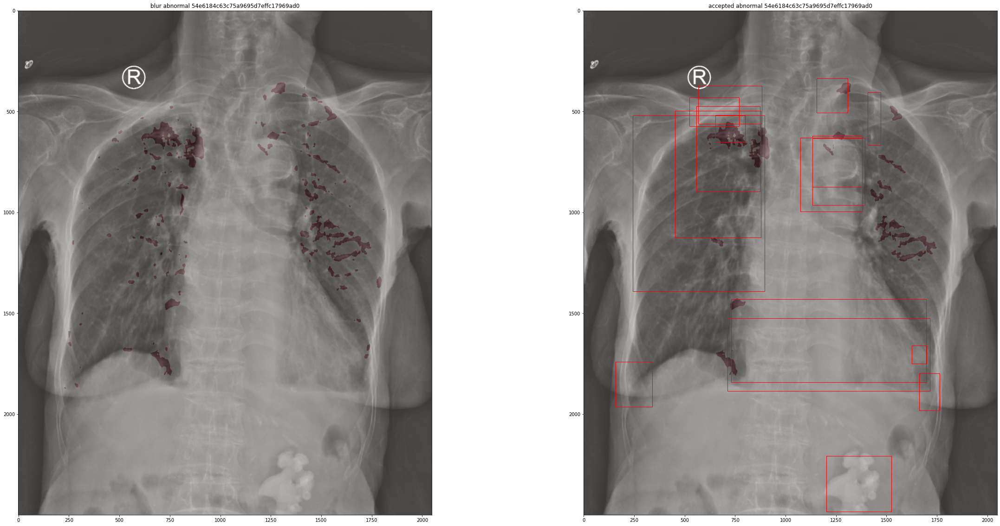

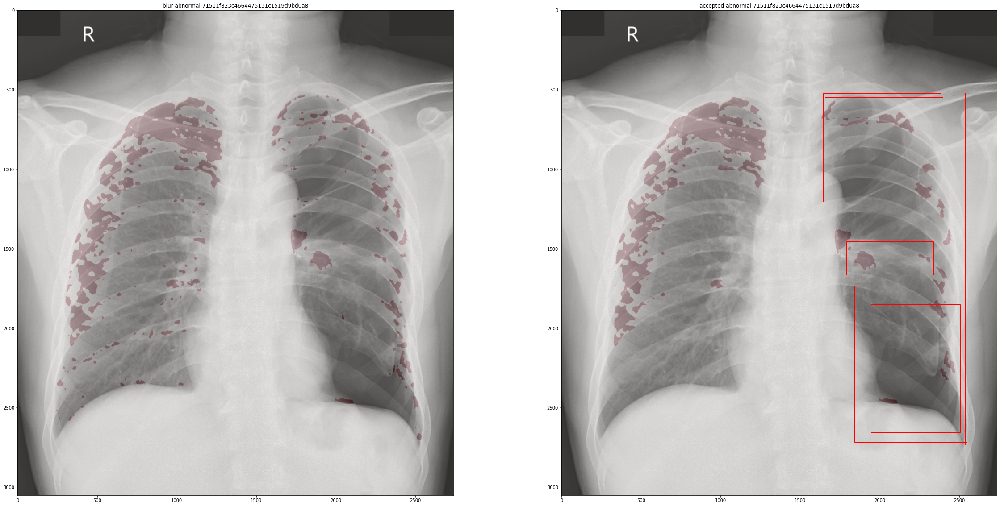

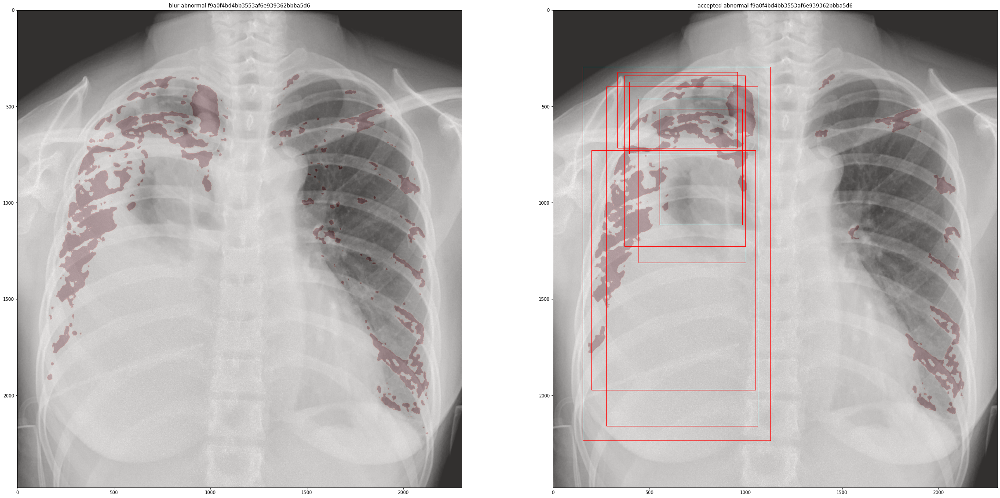

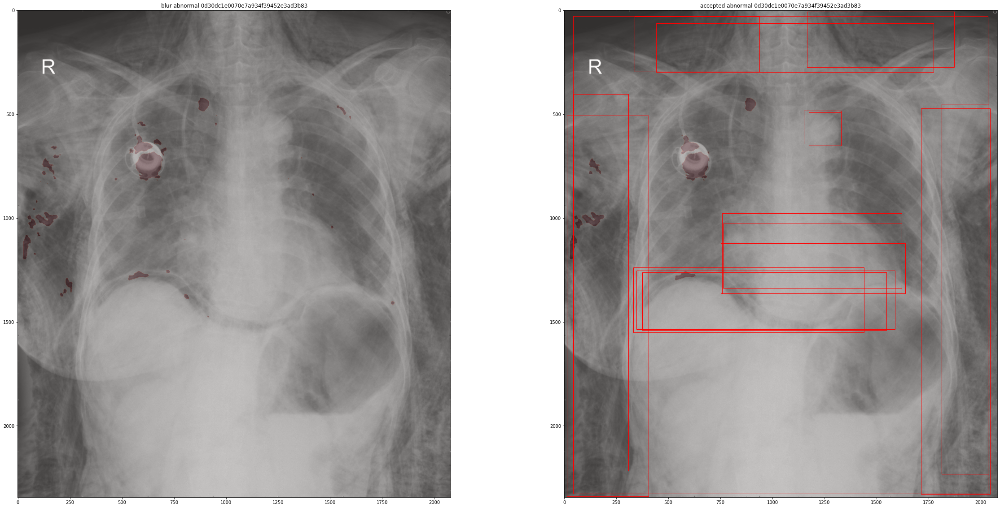

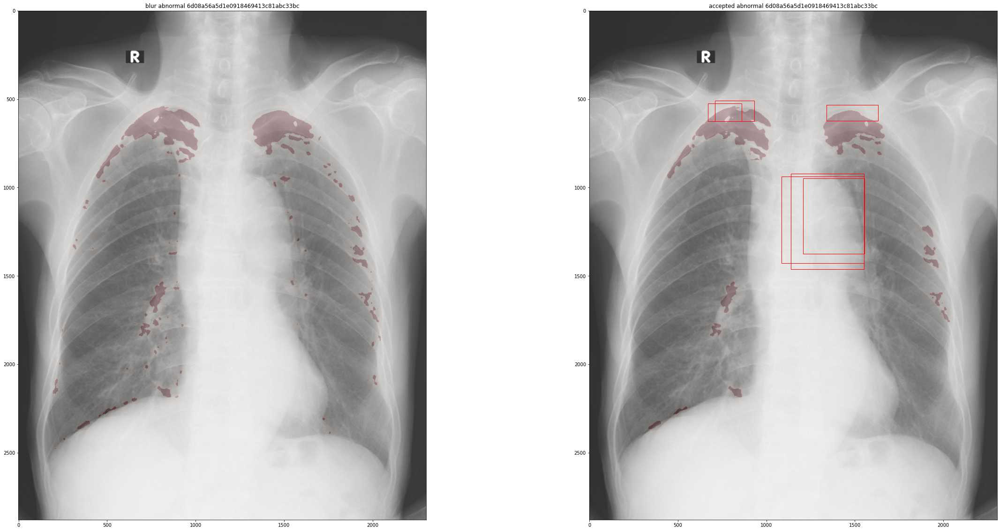

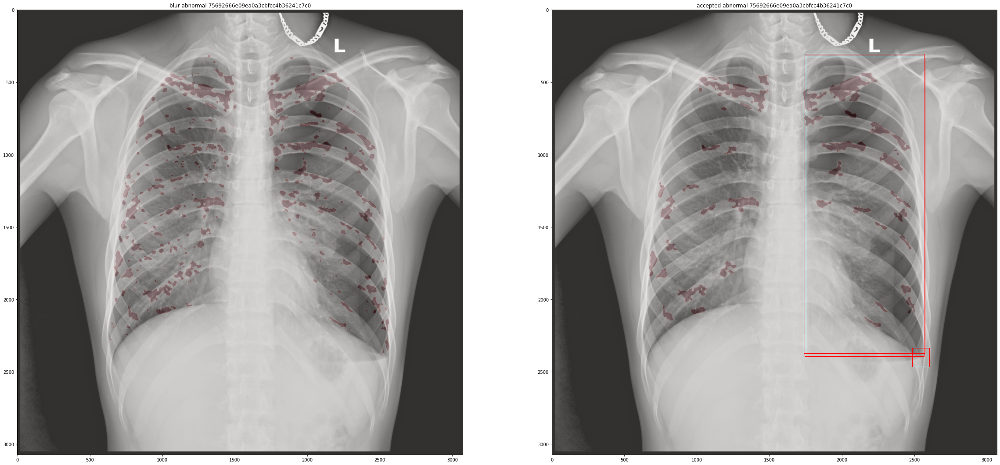

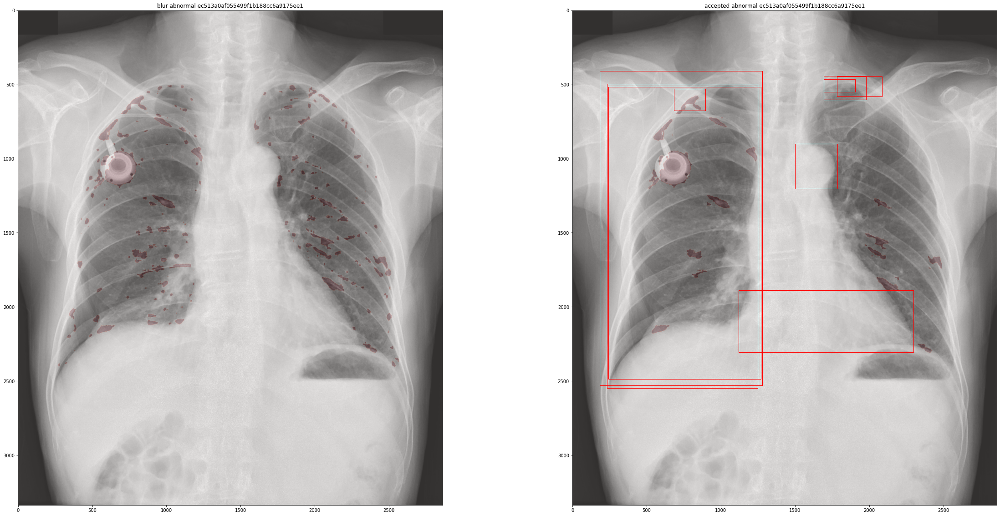

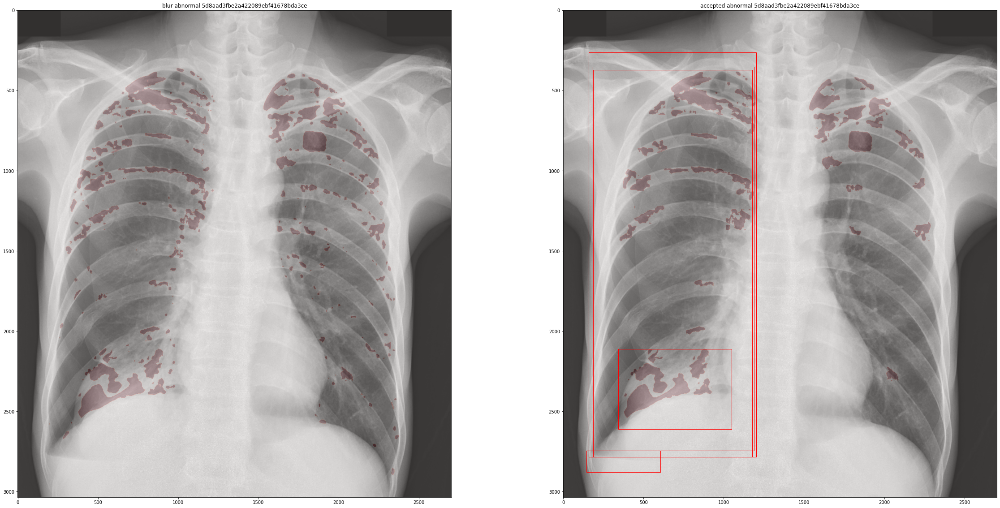

In [21]:
nb = len(abdetector.xrayobjects)
ncols=2
nrows = 1
train = pd.read_csv('./csv/train.csv')
for i in range(nb):
  plt.figure(figsize=(ncols*20,20))
  xobject = abdetector.xrayobjects[i]
  img_name = os.path.basename(xobject.path)
  img_name = os.path.splitext(img_name)[0]
  # Lấy phần bất thường được dự đoán ra
  ypred = cv2.resize(xobject.blur_abnormal,xobject.real_size[::-1])
  img = cv2.resize(xobject.img,xobject.real_size[::-1])
  plt.subplot(nrows,ncols,1)
  plt.imshow(img,cmap='gray')
  plt.imshow(ypred,cmap='Reds',alpha=0.2)
  plt.title('blur abnormal '+img_name)
  # Lấy những phần bất thường có kích thước lớn
  mpred = np.zeros((1024,1024),dtype=np.uint8)
  boxs = xobject.get_boxs_by_s(xobject.all_boxs,500)
  for box in boxs:
    x, y, w, h = box
    mpred[y:y+h,x:x+w] = 1
  mpred = cv2.resize(mpred,xobject.real_size[::-1])
  ypred = mpred*ypred
  plt.subplot(nrows,ncols,2)
  plt.imshow(img,cmap='gray')
  plt.imshow(ypred,cmap='Reds',alpha=0.2)
  ax = plt.gca()
  truth_boxs = get_round_truth(train,xobject.path,xobject.real_size)[0]
  for box in truth_boxs:
      # Create a Rectangle patch
      rect = Rectangle((box[0],box[1]),box[2]-box[0],box[3]-box[1],linewidth=1,edgecolor='r',facecolor='none')
      # Add the patch to the Axes
      ax.add_patch(rect)
  plt.title('accepted abnormal '+img_name)

6e4391555899c8474c4d32f42b2ba21b


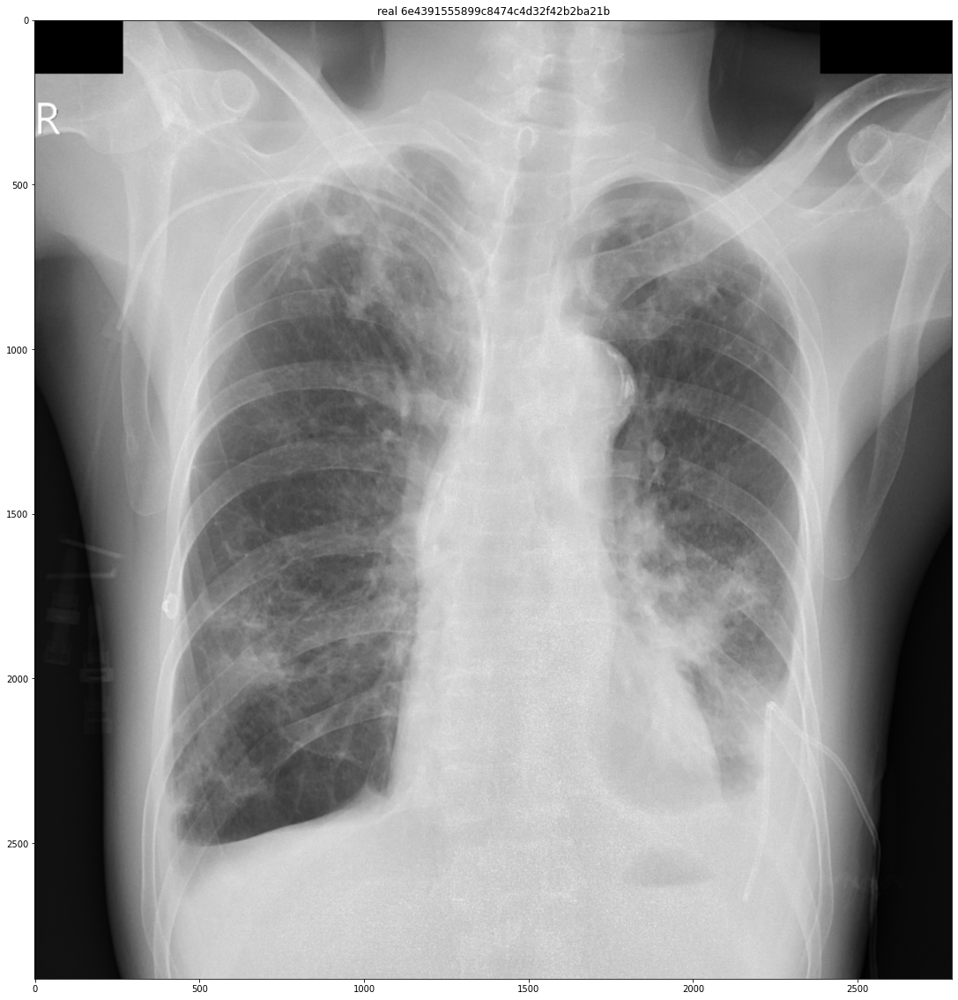

e3c5ff1eb0d55039f3bbc3c4875543c3


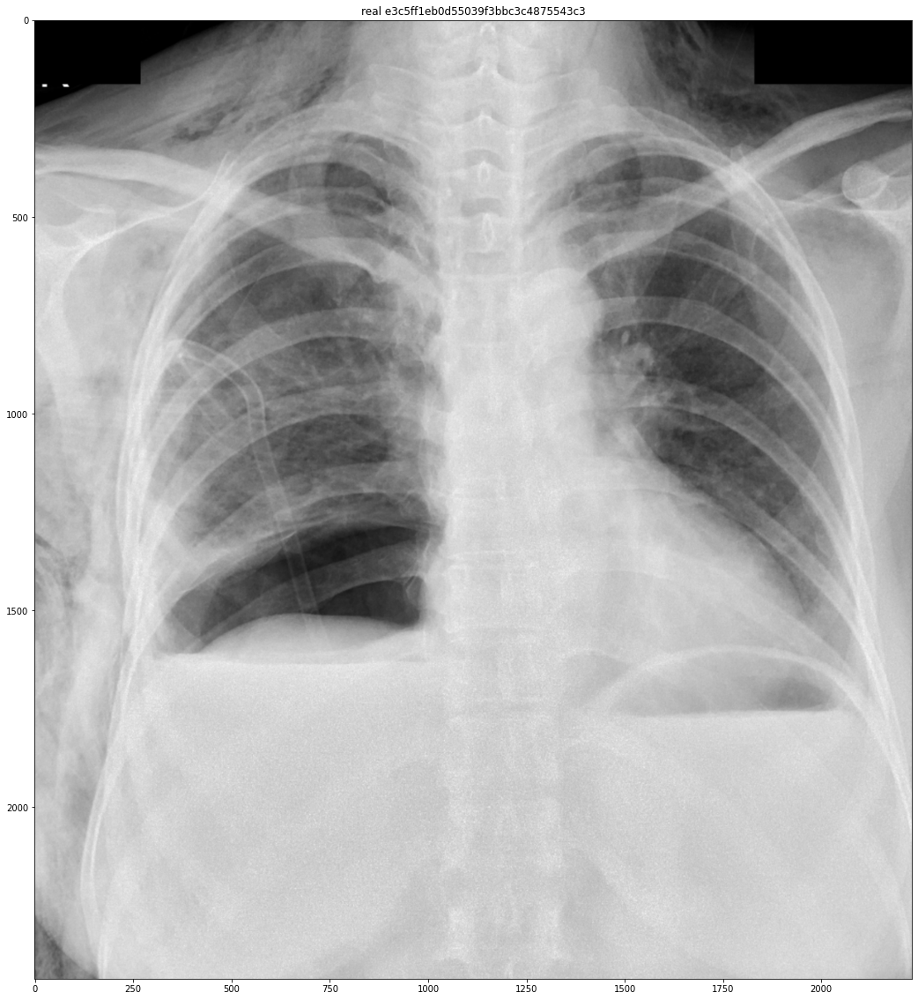

54e6184c63c75a9695d7effc17969ad0


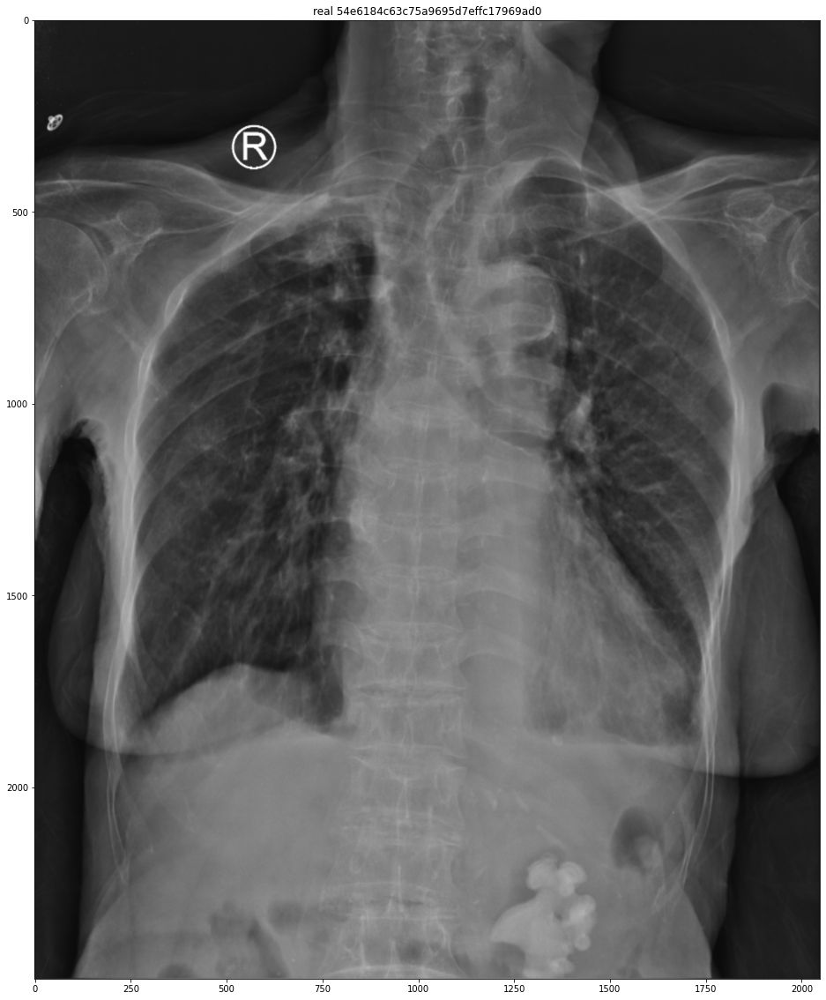

71511f823c4664475131c1519d9bd0a8


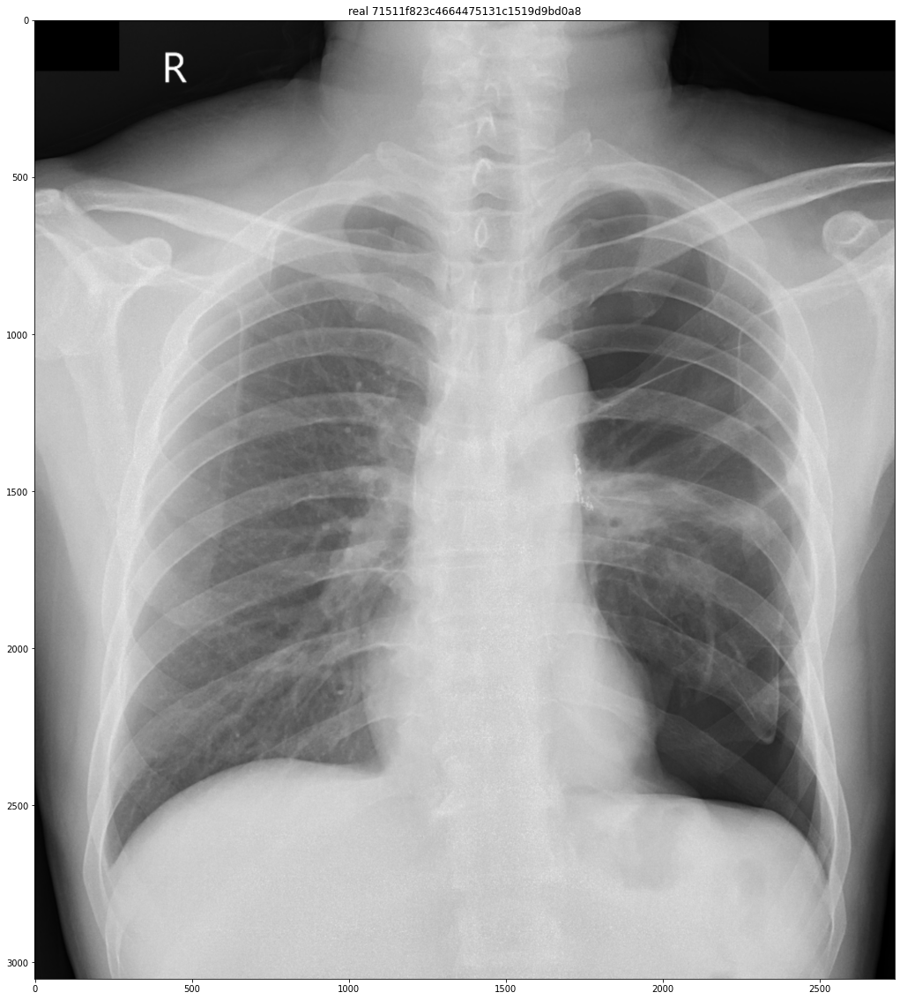

f9a0f4bd4bb3553af6e939362bbba5d6


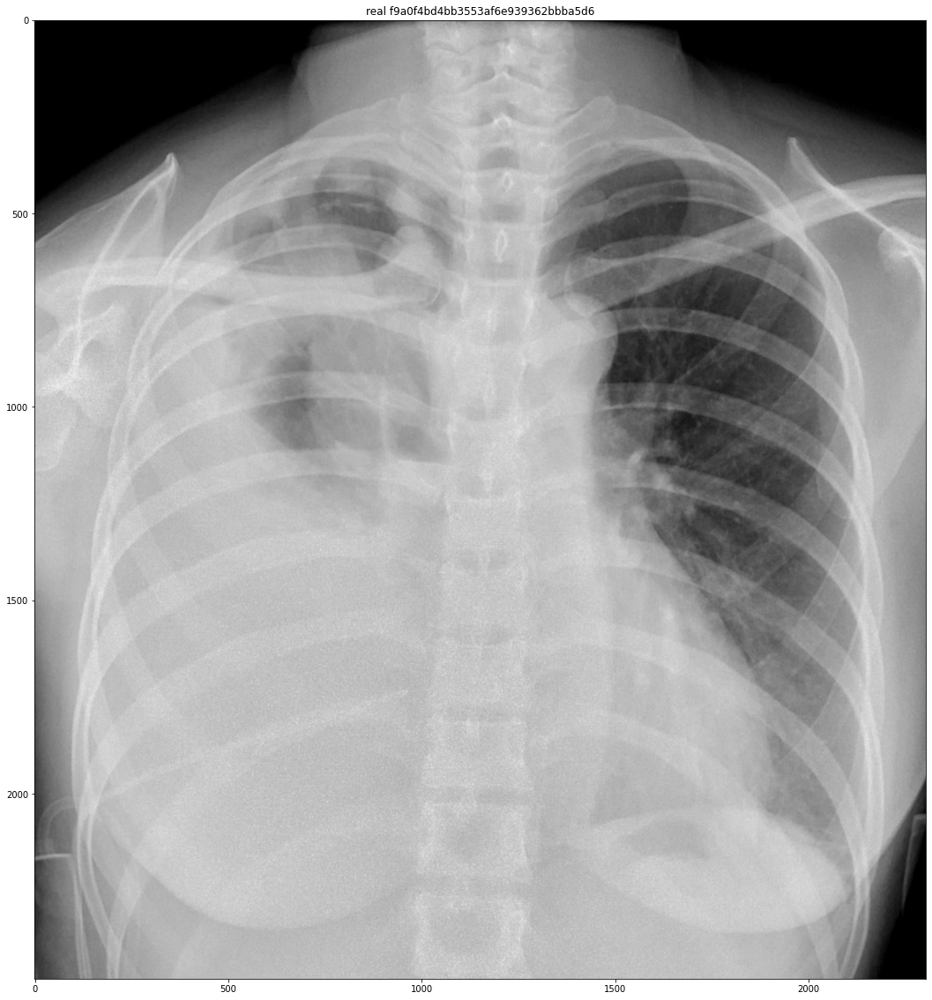

0d30dc1e0070e7a934f39452e3ad3b83


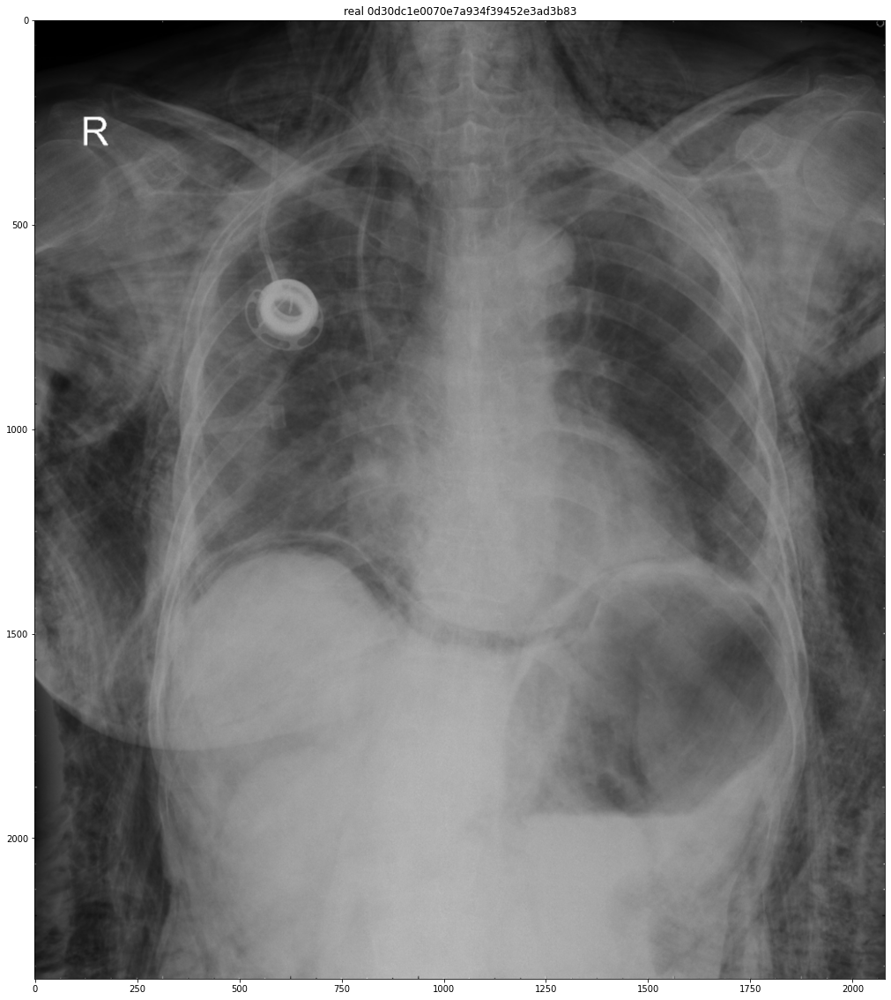

6d08a56a5d1e0918469413c81abc33bc


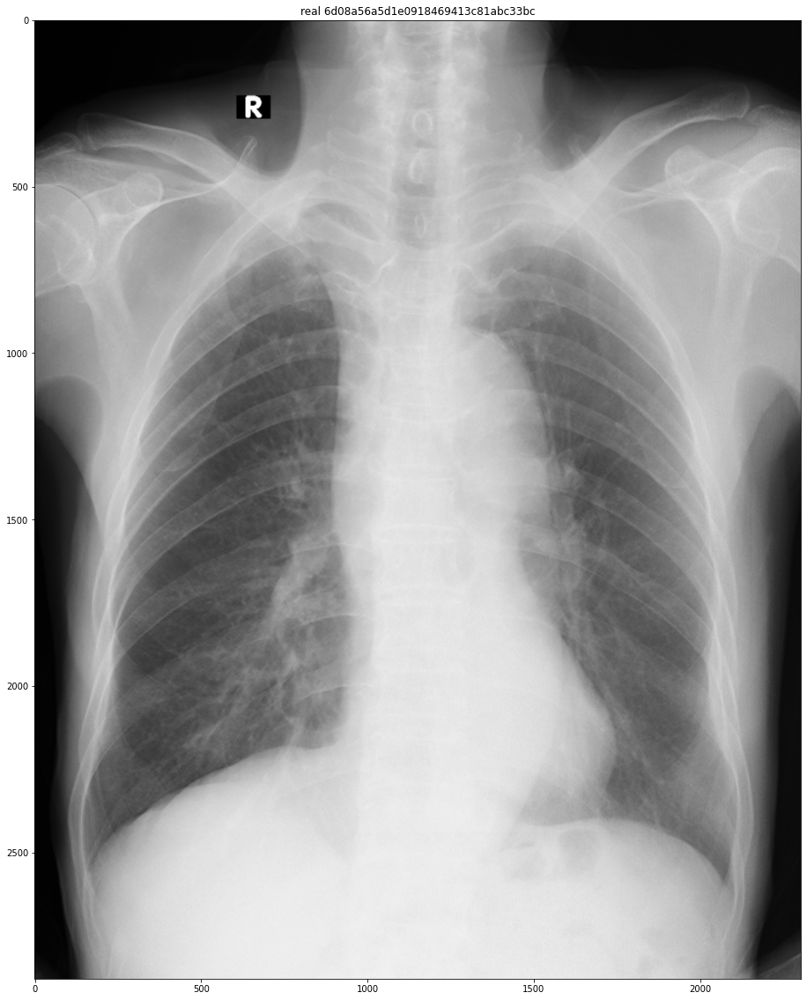

75692666e09ea0a3cbfcc4b36241c7c0


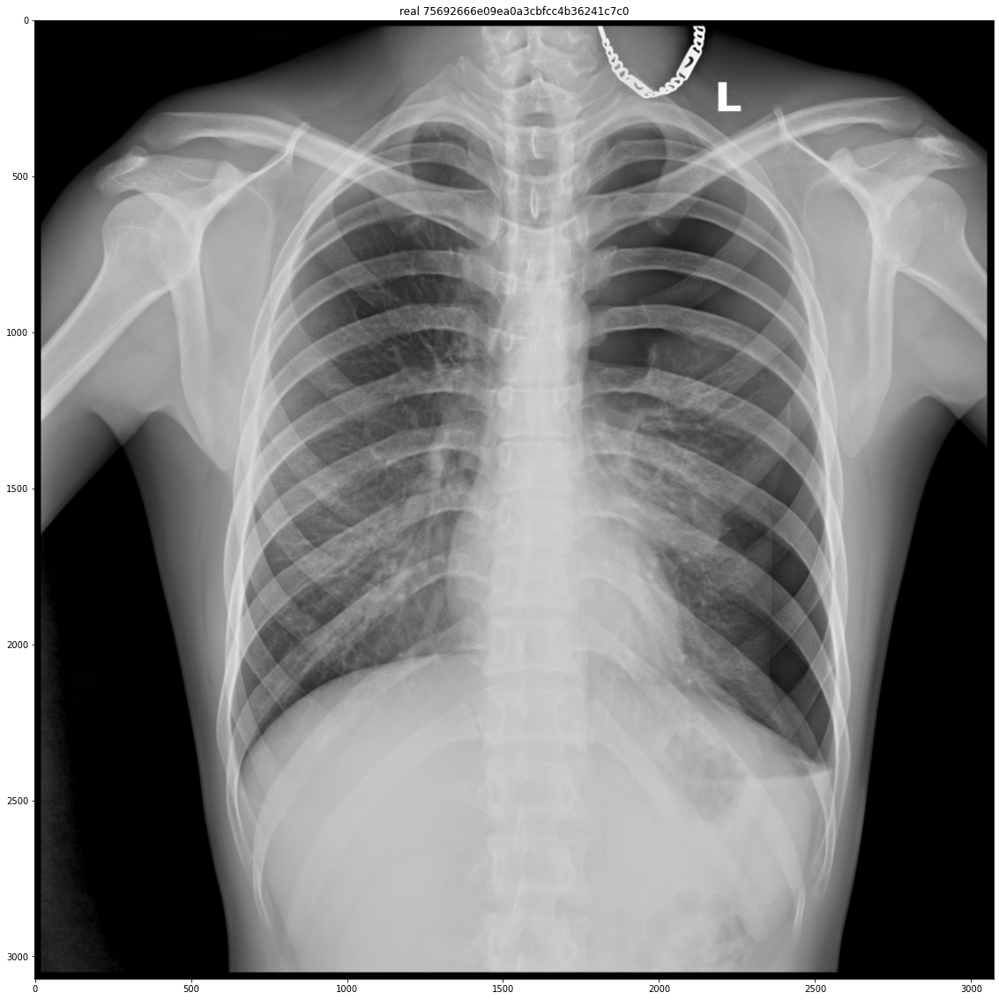

ec513a0af055499f1b188cc6a9175ee1


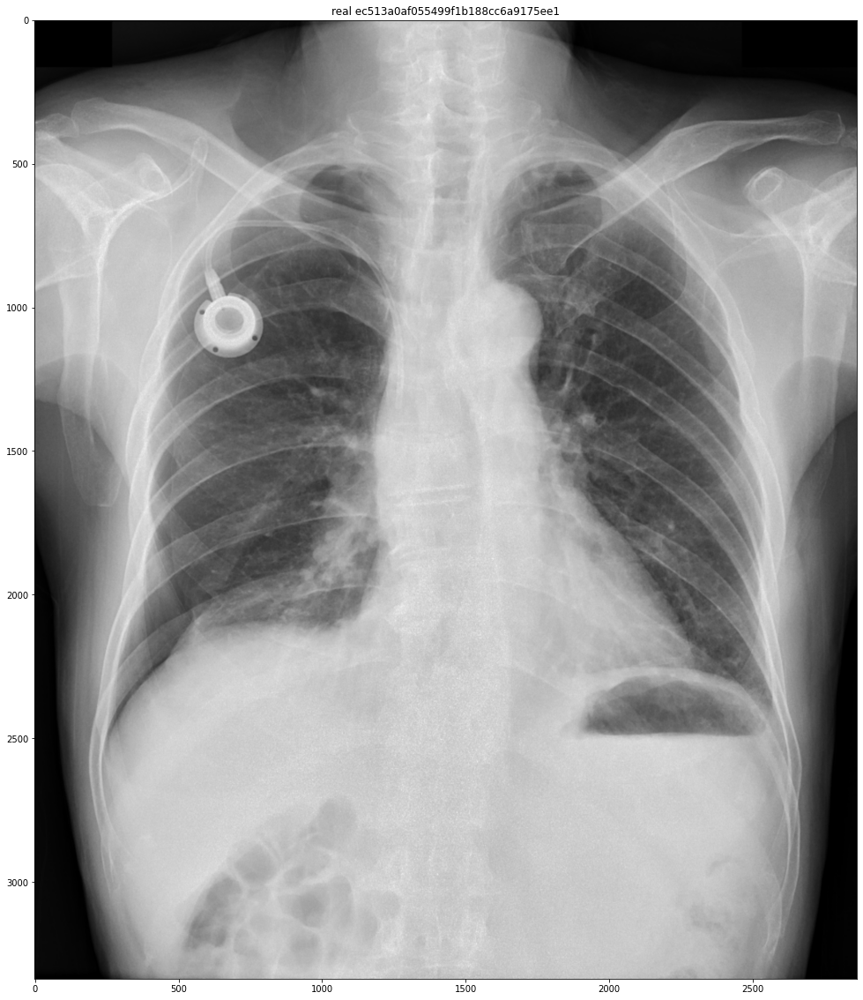

5d8aad3fbe2a422089ebf41678bda3ce


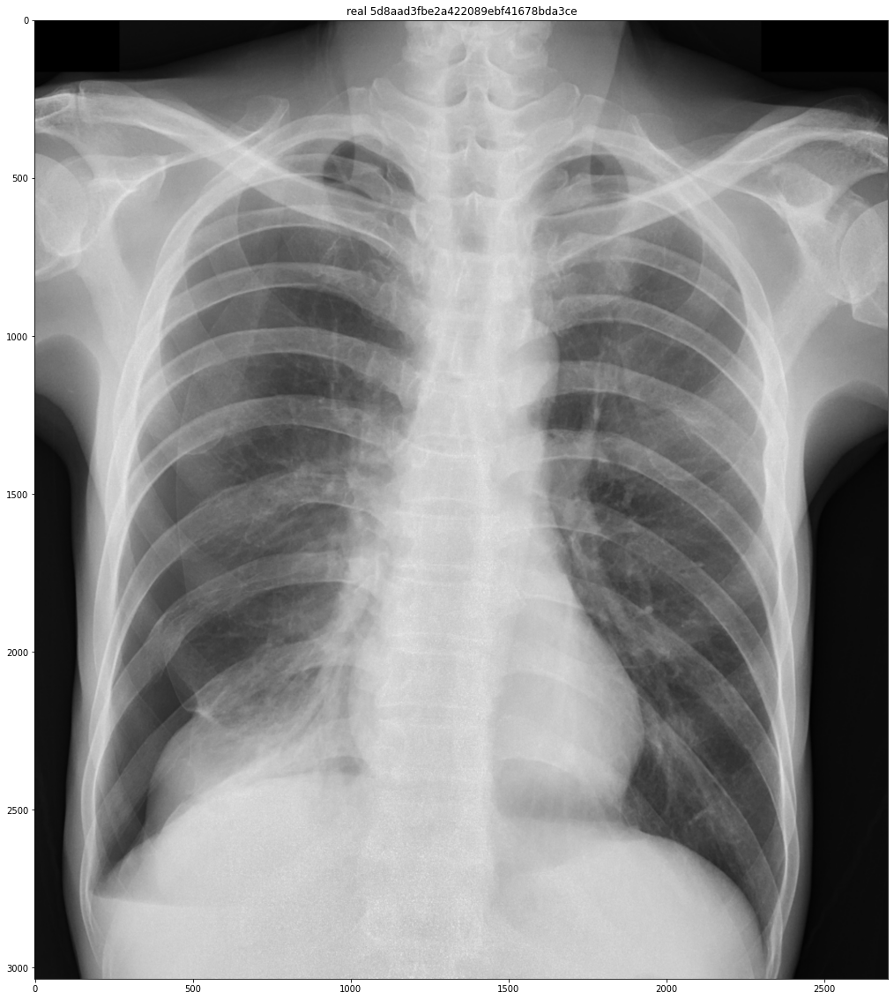

In [22]:
nb = len(abdetector.xrayobjects)
ncols = 1
nrows = 1
train = pd.read_csv('./csv/train.csv')
for i in range(nb):
  plt.figure(figsize=(ncols*20,20))
  xobject = abdetector.xrayobjects[i]
  img_name = os.path.basename(xobject.path)
  img_name = os.path.splitext(img_name)[0]
  print(img_name)
  img = cv2.resize(xobject.img,xobject.real_size[::-1])
  plt.subplot(nrows,ncols,1)
  plt.imshow(img,cmap='gray')
  plt.title('real '+img_name)
  plt.show()